# Washington State BDC Challenge Analysis

This will be a quick analysis of data from the BDC for the State of Washington based on data released from the FCC.

All of this data was downloaded from [here](https://broadbandmap.fcc.gov/data-download/challenge-data) and will be included in the repository associated with this analysis. We will work in reverse cronological order.

In [36]:
# Housekeeping stuff.
!python -m pip install --upgrade pip
!pip install --upgrade -r requirements.txt > output.txt
import zipfile,  pathlib, itables
import pandas as pd
import numpy as np
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
from pprint import pprint

## Load Data

In [37]:
dfColumnHints = {
    "location_id": "Int64",
    "zip_code": "Int64"
}
jul23zip = zipfile.ZipFile("Washington - Fabric Challenge - Resolved - jul23.zip")
jul23 = pd.read_csv(jul23zip.open(jul23zip.filelist[0].filename), dtype=dfColumnHints)
jul23zip.close()
mar23zip = zipfile.ZipFile("Washington - Fabric Challenge - Resolved - mar23.zip")
mar23 = pd.read_csv(mar23zip.open(mar23zip.filelist[0].filename), dtype=dfColumnHints)
mar23zip.close()
dec22zip = zipfile.ZipFile("Washington - Fabric Challenge - Resolved - dec22.zip")
dec22 = pd.read_csv(dec22zip.open(dec22zip.filelist[0].filename), dtype=dfColumnHints)
dec22zip.close()
nov22zip = zipfile.ZipFile("Washington - Fabric Challenge - Resolved - nov22.zip")
nov22 = pd.read_csv(nov22zip.open(nov22zip.filelist[0].filename), dtype=dfColumnHints)
nov22zip.close()

C:\Users\nick.pappin\AppData\Local\Temp\ipykernel_29144\1898070276.py:6: DtypeWarning: Columns (10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  jul23 = pd.read_csv(jul23zip.open(jul23zip.filelist[0].filename), dtype=dfColumnHints)


## July - 2023

Let's start looking at the number of challenges that were successful and how many were overturned. The full data table will be at the end and the original CSV is in the corresponding zip file.

In [38]:
jul23.adjudication_status.value_counts(dropna=False)

adjudication_status
Overturned    159956
Upheld         21867
Name: count, dtype: int64

And let's look at it with the category code.

In [39]:
jul23.pivot_table('challenge_id', index='category_code_desc', columns='adjudication_status', aggfunc="count")

adjudication_status,Overturned,Upheld
category_code_desc,,
Add additional address for the location,1,7
Incorrect Location Address,28,403
Incorrect Location Building Type,4432,13604
Incorrect Location Unit Count,2,18
Location is Not Broadband Serviceable,1956,617
Location is Not Within Correct Building Footprint,89,79
Missing Broadband Serviceable Location,153448,7139


### Maps

First we are going to pull out the locations with no geographic information. This removed about 20K locations.

In [40]:
jul23geo = gpd.GeoDataFrame(jul23[jul23.latitude.notna() & jul23.longitude.notna()])
jul23geo = jul23geo.set_geometry(gpd.points_from_xy(jul23geo.longitude, jul23geo.latitude), crs='EPSG:4326')
jul23geo = jul23geo.to_crs(3857)
droppedChallenges = jul23.shape[0] - jul23geo.shape[0]
print(f'Before dropping challenges without coordinates: {jul23.shape[0]}')
print(f'After dropping challenges without coordinates: {jul23geo.shape[0]}')
print(f'Challenges dropped: {droppedChallenges}')

Before dropping challenges without coordinates: 181823
After dropping challenges without coordinates: 160755
Challenges dropped: 21068


With the no data challenges removed we get this map.

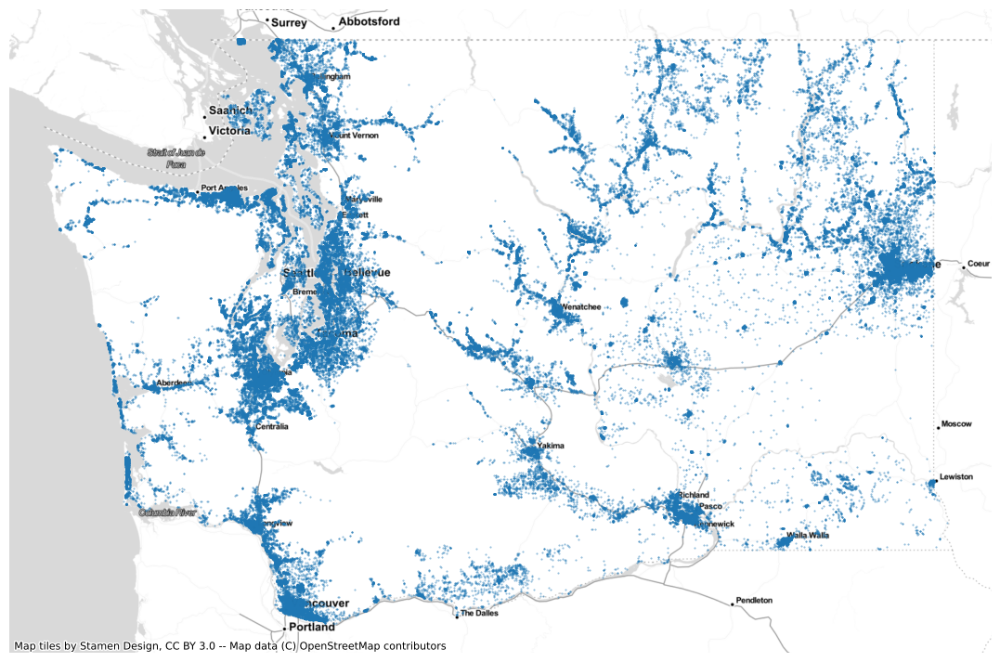

In [41]:
ax = jul23geo.plot(marker='.', markersize = 1, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=jul23geo.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

Let's look at the rejected challenges first.

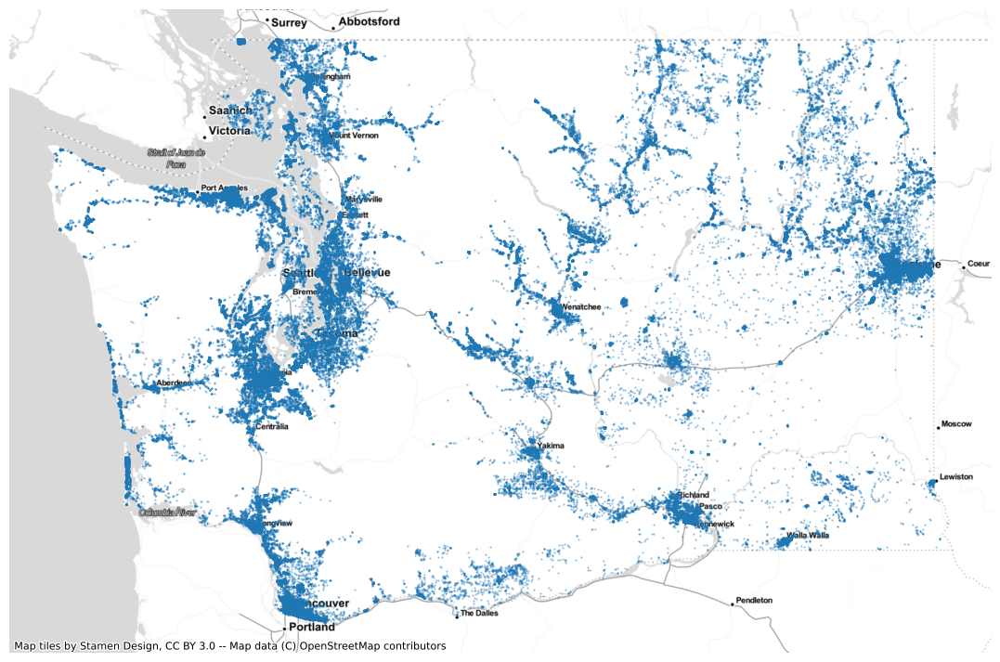

In [42]:
rejected = jul23geo[jul23geo.adjudication_status == 'Overturned']
ax = rejected.plot(marker='.', markersize = 1, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=rejected.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

Not really much to see here aside from we challenged all over the state.

In [43]:
itables.show(rejected)

In [44]:
itables.show(rejected.adjudication_code_desc.value_counts())

Unfortunatly with this dataset there is no real way to see or intuit failed challenges by FRN/Organization. 

Here are the accepted challenges.

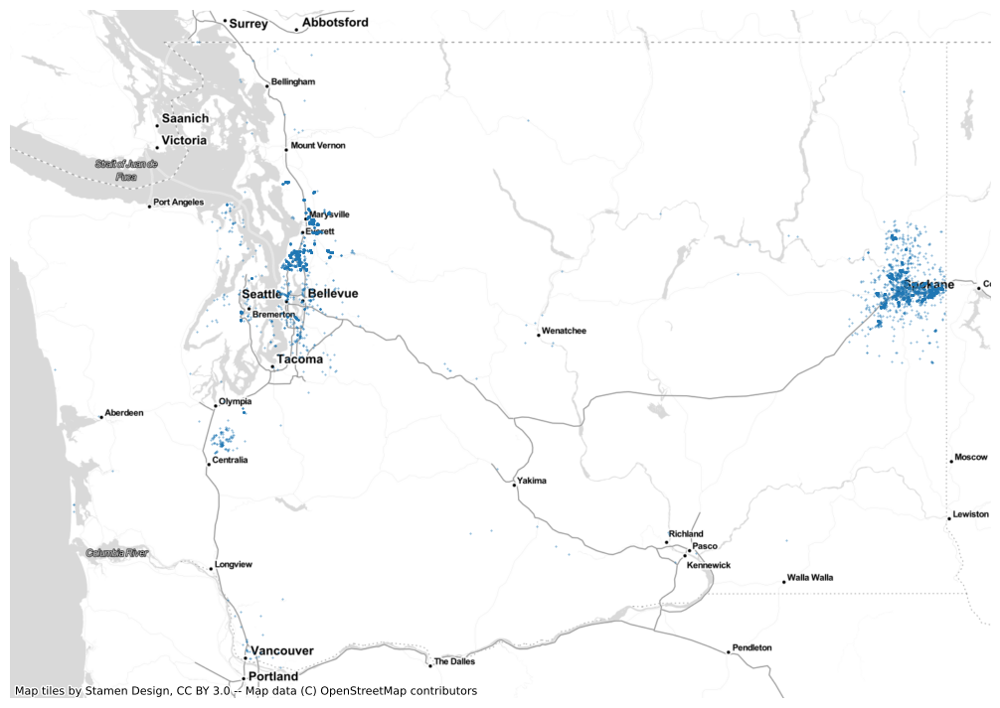

In [45]:
upheld = jul23geo[jul23geo.adjudication_status == 'Upheld']
ax = upheld.plot(marker='.', markersize = 1, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=upheld.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

Interesting to see where there were really successful challenge attempts this go around. And here is an interactive version.

In [46]:
upheld.explore()

In [47]:
itables.show(upheld)

In [48]:
itables.show(upheld.adjudication_code_desc.value_counts())

### Data

Finally here is the whole table from July of 2023.

In [49]:
itables.show(jul23)

## March - 2023

Let's start looking at the number of challenges that were successful and how many were overturned. The full data table will be at the end and the original CSV is in the corresponding zip file.

In [50]:
mar23.adjudication_status.value_counts(dropna=False)

adjudication_status
NaN    13
Name: count, dtype: int64

As you can see there aren't very many challenges for this time period. The maps are all zoomed in around Walla Walla. It is also unclear if these were integrated into the fabric.

### Maps

In [51]:
mar23geo = gpd.GeoDataFrame(mar23[mar23.latitude.notna() & mar23.longitude.notna()])
mar23geo = mar23geo.set_geometry(gpd.points_from_xy(mar23geo.longitude, mar23geo.latitude), crs='EPSG:4326')
mar23geo = mar23geo.to_crs(3857)
droppedChallenges = mar23.shape[0] - mar23geo.shape[0]
print(f'Before dropping challenges without coordinates: {mar23.shape[0]}')
print(f'After dropping challenges without coordinates: {mar23geo.shape[0]}')
print(f'Challenges dropped: {droppedChallenges}')

Before dropping challenges without coordinates: 13
After dropping challenges without coordinates: 13
Challenges dropped: 0


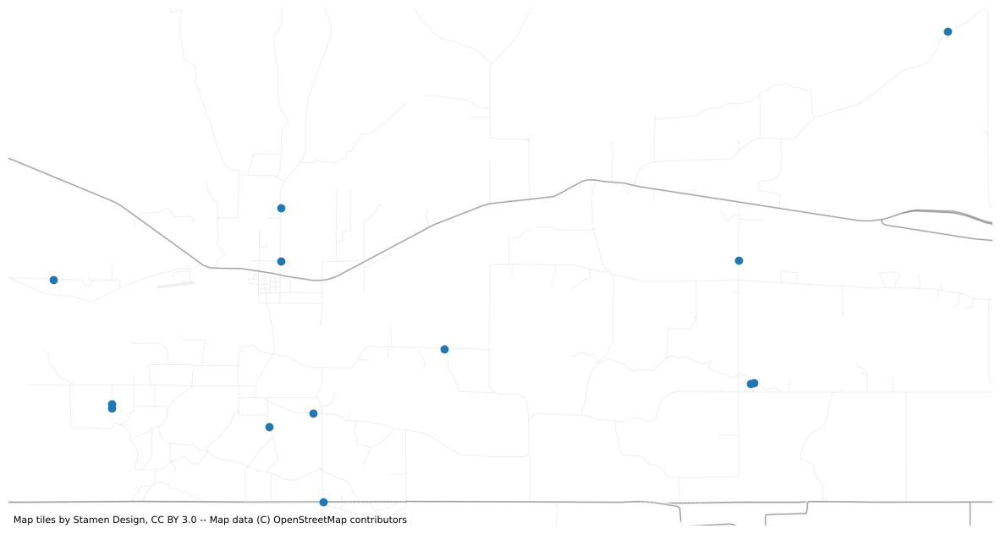

In [52]:
ax = mar23geo.plot(figsize=(15,9))
cx.add_basemap(ax, crs=mar23geo.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

In [53]:
mar23geo.explore()

I don't really think we need to look to much deeper into this one

### Data

Finally here is the whole table from March of 2023.

In [54]:
itables.show(mar23)

## December 2022

Let's start looking at the number of challenges that were successful and how many were overturned. The full data table will be at the end and the original CSV is in the corresponding zip file.

In [55]:
print(dec22.adjudication_status.value_counts(dropna=False))

adjudication_status
Upheld        5269
Overturned    2388
NaN             17
Name: count, dtype: int64


In [56]:
dec22.pivot_table('challenge_id', index='category_code_desc', columns='adjudication_status', aggfunc="count")

adjudication_status,Overturned,Upheld
category_code_desc,,
Incorrect Location Address,108,119
Incorrect Location Building Type,136,4640
Incorrect Location Unit Count,12,132
Location is Not Within Correct Building Footprint,107,19
Missing Broadband Serviceable Location,2025,359


### Maps

In [57]:
dec22geo = gpd.GeoDataFrame(dec22[dec22.latitude.notna() & dec22.longitude.notna()])
dec22geo = dec22geo.set_geometry(gpd.points_from_xy(dec22geo.longitude, dec22geo.latitude), crs='EPSG:4326')
dec22geo = dec22geo.to_crs(3857)
droppedChallenges = dec22.shape[0] - dec22geo.shape[0]
print(f'Before dropping challenges without coordinates: {dec22.shape[0]}')
print(f'After dropping challenges without coordinates: {dec22geo.shape[0]}')
print(f'Challenges dropped: {droppedChallenges}')

Before dropping challenges without coordinates: 7674
After dropping challenges without coordinates: 2527
Challenges dropped: 5147


Here is the map of all of the challenges with data points with no geographic coordinates removed.

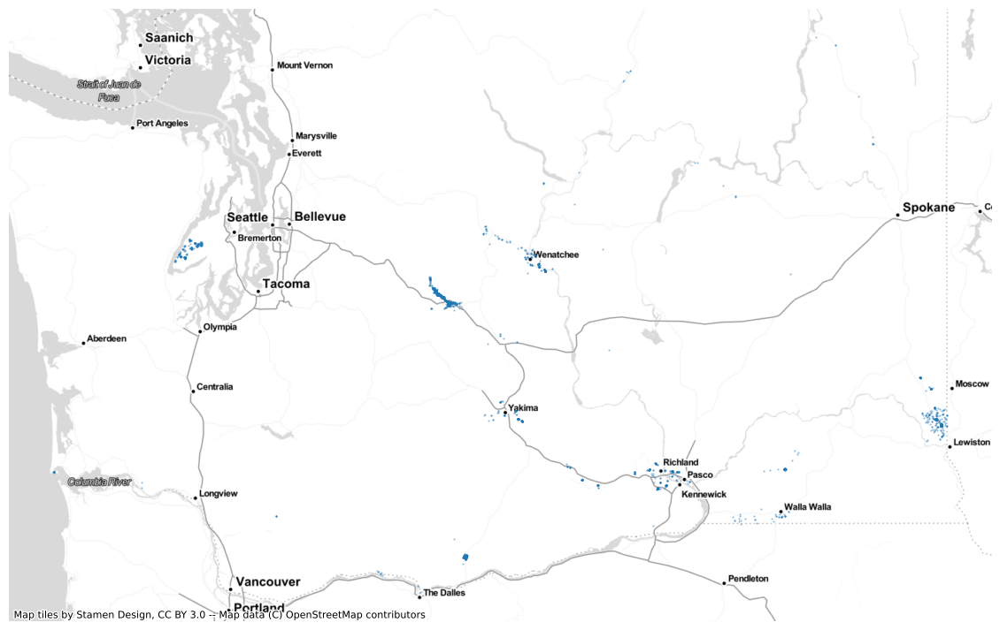

In [58]:
ax = dec22geo.plot(marker='.', markersize = 1, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=dec22geo.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

And lets look at the rejected challenge map first.

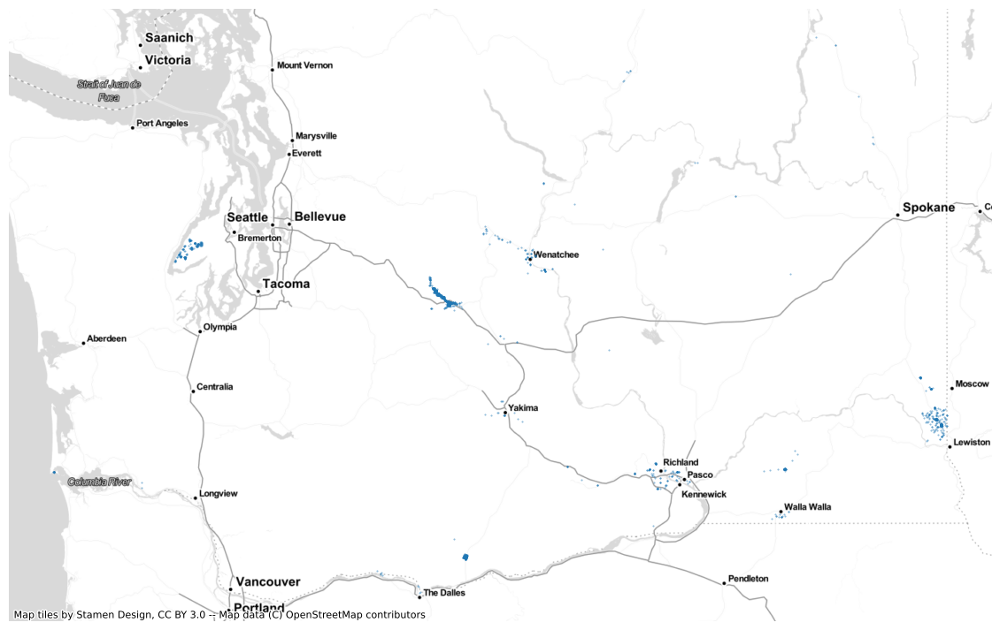

In [59]:
rejected = dec22geo[dec22geo.adjudication_status == 'Overturned']
ax = rejected.plot(marker='.', markersize = 1, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=rejected.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

In [60]:
itables.show(rejected)

In [61]:
itables.show(rejected.category_code_desc.value_counts())

And now lets look at the accepted challenges.

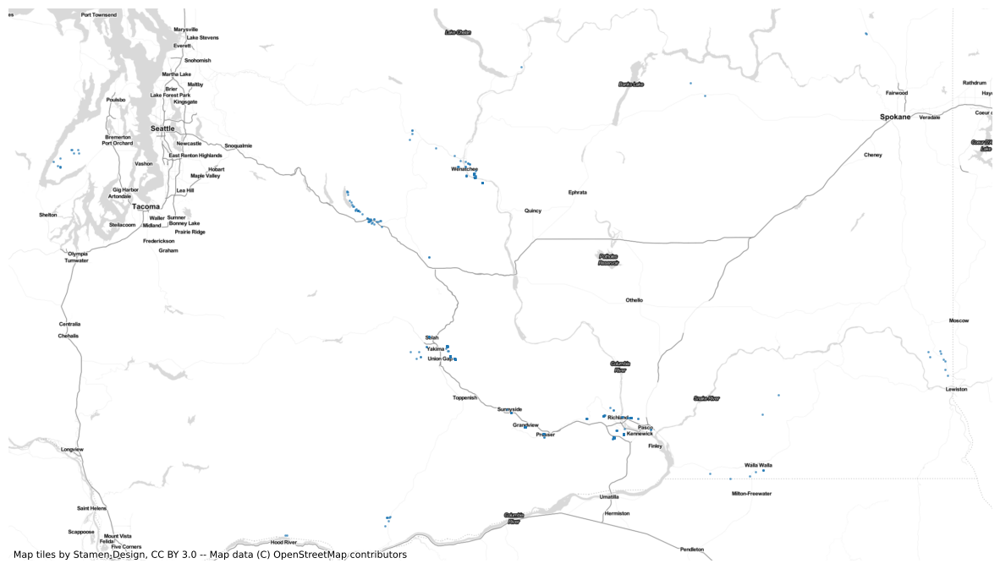

In [62]:
upheld = dec22geo[dec22geo.adjudication_status == 'Upheld']
ax = upheld.plot(marker='.', markersize = 5, figsize=(15,9), alpha=.5)
cx.add_basemap(ax, crs=upheld.crs.to_string(), source=cx.providers.Stamen.TonerLite)
ax = ax.axis('off')

In [63]:
itables.show(upheld)

### Data

Finally here is the whole table from December of 2022.

In [64]:
itables.show(dec22)

## November 2022

Let's start looking at the number of challenges that were successful and how many were overturned. The full data table will be at the end and the original CSV is in the corresponding zip file.

In [65]:
print(nov22.category_code_desc.value_counts(dropna=False))

category_code_desc
Missing Broadband Serviceable Location    4
Name: count, dtype: int64


### Maps

Here is the map of the data for November. Pretty self explanitory.

In [66]:
nov22geo = gpd.GeoDataFrame(nov22[nov22.latitude.notna() & nov22.longitude.notna()])
nov22geo = nov22geo.set_geometry(gpd.points_from_xy(nov22geo.longitude, nov22geo.latitude), crs='EPSG:4326')
nov22geo = nov22geo.to_crs(3857)
droppedChallenges = nov22.shape[0] - nov22geo.shape[0]
print(f'Before dropping challenges without coordinates: {nov22.shape[0]}')
print(f'After dropping challenges without coordinates: {nov22geo.shape[0]}')
print(f'Challenges dropped: {droppedChallenges}')

Before dropping challenges without coordinates: 4
After dropping challenges without coordinates: 4
Challenges dropped: 0


In [67]:
nov22geo.explore()

### Data

Finally here is the whole table from November of 2022.

In [68]:
itables.show(nov22)

## Appendix A - Data references

In [69]:
adjudicationCodes = jul23[['adjudication_code', 'adjudication_code_desc']].set_index('adjudication_code').drop_duplicates().reset_index()
itables.show(adjudicationCodes)

In [70]:
jul23.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181823 entries, 0 to 181822
Data columns (total 25 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   challenge_id                 181823 non-null  int64  
 1   fabric_vintage               181823 non-null  object 
 2   category_code                181823 non-null  int64  
 3   category_code_desc           181823 non-null  object 
 4   location_id                  21236 non-null   Int64  
 5   location_state               181823 non-null  object 
 6   address_primary              161014 non-null  object 
 7   city                         161026 non-null  object 
 8   state                        161026 non-null  object 
 9   zip_code                     161025 non-null  Int64  
 10  zip_code_suffix              937 non-null     object 
 11  unit_count                   160607 non-null  float64
 12  building_type_code           178623 non-null  object 
 13 